# Etap 3.
## Wczytanie przetworzonych danych po PCA z plików "prepared_features_after_PCA_(train/val/test).csv"
## Przygotowanie etykiet klasowych (jeśli dotyczy)
## Trening i testowanie różnych modeli 
## Ewaluacja i porównanie modeli
## Wizualizacja wyników


In [1]:
import pandas as pd
import math  

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn_extra.cluster import KMedoids

from sklearn.neighbors import NearestNeighbors

import plotly.express as px
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Ścieżki do plików
split_names = ['train', 'val', 'test']
paths = [f"Data/Concatenated Features/prepared_features_after_PCA_{split}.csv" for split in split_names]

# Wczytanie danych do listy
X_pca = [pd.read_csv(path) for path in paths]
# X_pca[0] - train
# X_pca[1] - val
# X_pca[2] - test


In [3]:
def prepare_X(df):
    return df.drop(columns=['Nazwa']) if 'Nazwa' in df.columns else df

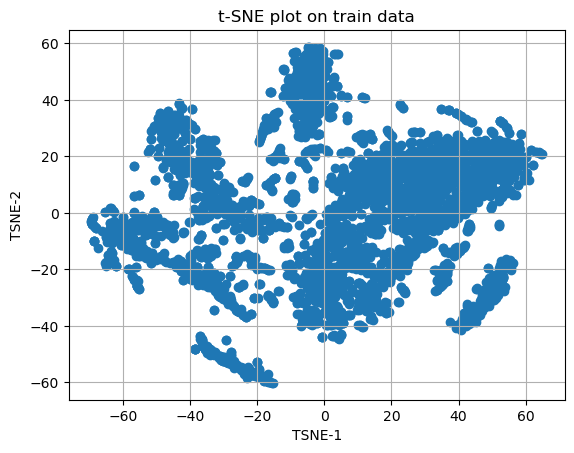

In [4]:
X_input =prepare_X(X_pca[0]) 

# t-SNE na danych treningowych
tsne = TSNE(n_components=2, perplexity=40, random_state=42)
X_tsne = tsne.fit_transform(X_input)

# Wykres
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE plot on train data')
plt.xlabel('TSNE-1')
plt.ylabel('TSNE-2')
plt.grid(True)
plt.show()

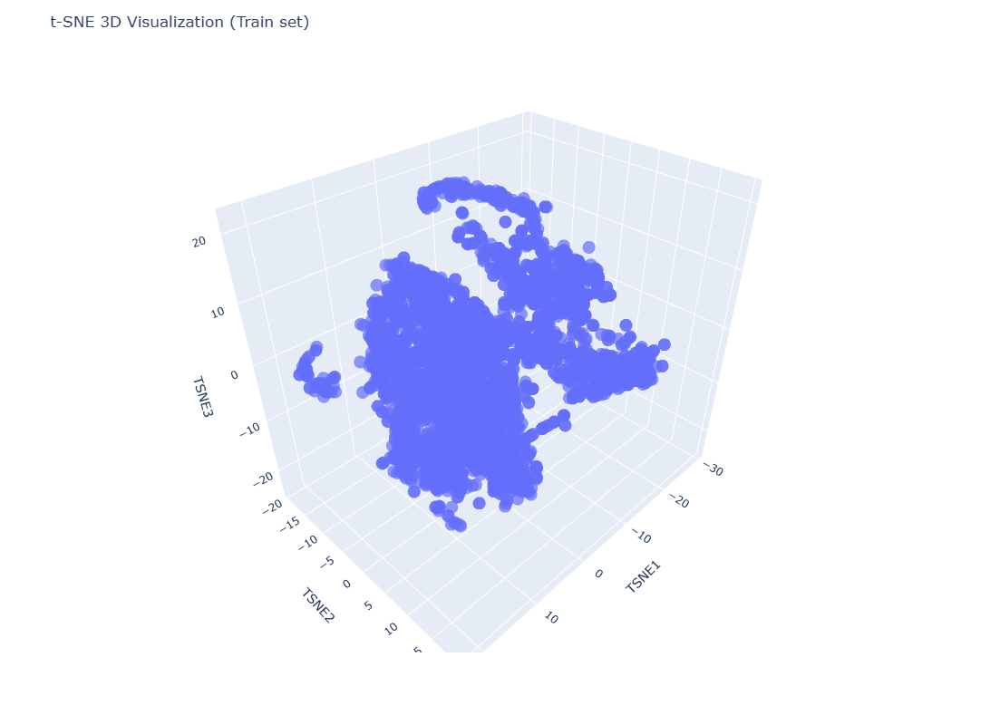

In [5]:
X_input =prepare_X(X_pca[0]) 

# t-SNE 3D na danych treningowych
tsne = TSNE(n_components=3, perplexity=40, random_state=42)
X_tsne_3d = tsne.fit_transform(X_input)

# Przygotowanie DataFrame
df_tsne = pd.DataFrame(X_tsne_3d, columns=['TSNE1', 'TSNE2', 'TSNE3'])


# Interaktywny wykres 3D
fig = px.scatter_3d(df_tsne, x='TSNE1', y='TSNE2', z='TSNE3', opacity=0.7)
fig.update_layout(title='t-SNE 3D Visualization (Train set)', width=1000, height=800)
fig.show()


In [6]:
def evaluate_clustering(X, labels, name):
    sil = silhouette_score(X, labels)
    db = davies_bouldin_score(X, labels)
    ch = calinski_harabasz_score(X, labels)
    return {"Method": name, "Silhouette": sil, "Davies-Bouldin": db, "Calinski-Harabasz": ch}

In [7]:
from sklearn.base import clone
from sklearn.neighbors import KNeighborsClassifier

def fit_predict_all_splits(model, X_pca, model_name="Model"):
    """
    model: instancja modelu klasteryzacyjnego (np. KMeans, AgglomerativeClustering, DBSCAN, itp.)
    X_pca: lista [X_train_df, X_val_df, X_test_df] (np. z read_csv)
    prepare_X: funkcja do przygotowania danych (np. usunięcia kolumny 'Nazwa')
    model_name: nazwa modelu (string) do użycia jako klucz

    Zwraca:
        labels_dict: słownik {split: {model_name: labels}}
    """
    splits = ['train', 'val', 'test']
    labels_dict = {split: {} for split in splits}

    X_train = prepare_X(X_pca[0]).to_numpy()
    model = clone(model)  # bezpieczna kopia

    try:
        # Fit na treningu
        labels_train = model.fit_predict(X_train)
        labels_dict['train'][model_name] = labels_train

        # Przewidywanie dla val/test
        if hasattr(model, 'predict'):
            for i, split in enumerate(['val', 'test'], start=1):
                X_other = prepare_X(X_pca[i])
                labels_other = model.predict(X_other)
                labels_dict[split][model_name] = labels_other
        else:
            # KNN z jednym sąsiadem na centroidach
            knn = KNeighborsClassifier(n_neighbors=1)
            knn.fit(X_train, labels_train)
            for i, split in enumerate(['val', 'test'], start=1):
                X_other = prepare_X(X_pca[i]).to_numpy()
                labels_other = knn.predict(X_other)
                labels_dict[split][model_name] = labels_other

    except Exception as e:
        print(f"Błąd dla modelu '{model_name}': {e}")

    return labels_dict


In [8]:
results = {}
labels_dict = {
    "train": {},
    "val": {},
    "test": {}
}

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of

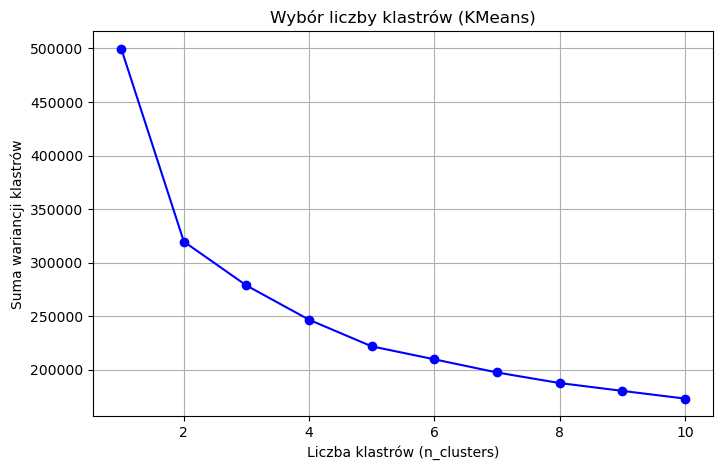

In [9]:
# Przygotowanie danych
X_prepared =prepare_X(X_pca[0]) 

# Zakres liczby klastrów do przetestowania
cluster_range = range(1, 11)
suma_wariancji_klastrow = []

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_prepared)
    suma_wariancji_klastrow.append(kmeans.inertia_)  # inertia = suma wariancji klastrów

# Rysowanie wykresu
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, suma_wariancji_klastrow, 'bo-')
plt.xlabel('Liczba klastrów (n_clusters)')
plt.ylabel('Suma wariancji klastrów')
plt.title('Wybór liczby klastrów (KMeans)')
plt.grid(True)
plt.show()


In [10]:
# KMeans
kmeans = KMeans(n_clusters=5, random_state=42)
labels_dict_kmeans = fit_predict_all_splits(kmeans, X_pca, model_name="KMeans")

for split in ['train', 'val', 'test']:
    labels_dict[split].update(labels_dict_kmeans[split])

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but KMeans was fitted without feature names

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but KMeans was fitted without feature names



In [11]:
# Agglomerative Clustering

from sklearn.neighbors import NearestCentroid

linkages = ['ward', 'complete', 'average', 'single']
splits = ['train', 'val', 'test']
labels_dict = {split: {} for split in splits}

for linkage in linkages:
    agglo = AgglomerativeClustering(n_clusters=5, linkage=f"{linkage}")
    labels_dict_agglo = fit_predict_all_splits(agglo, X_pca,  model_name=f"Agglomerative {linkage}")
    # scal do głównego słownika
    for split in splits:
        labels_dict[split].update(labels_dict_agglo[split])




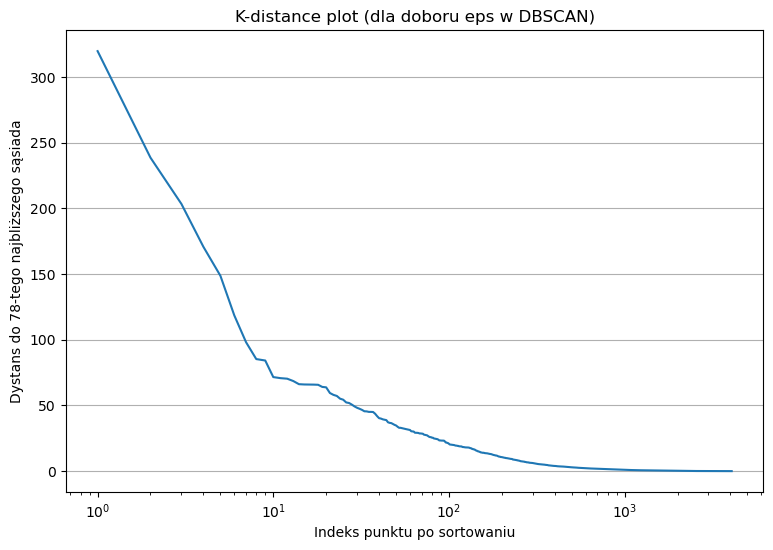

In [12]:
minPts = 2 *prepare_X(X_pca[0]).shape[1]  # min_samples
nbrs = NearestNeighbors(n_neighbors=minPts).fit(prepare_X(X_pca[0]))
distances, indices = nbrs.kneighbors(prepare_X(X_pca[0]))

# Posortuj dystanse do minPts-tego sąsiada
distanceDec = sorted(distances[:, minPts - 1], reverse=True)

# Wykres
fig = plt.figure(figsize=(9, 6))
ax1 = fig.add_subplot(111)
ax1.plot(range(1, X_pca[0].shape[0] + 1), distanceDec)

plt.xlabel('Indeks punktu po sortowaniu')
plt.ylabel(f'Dystans do {minPts}-tego najbliższego sąsiada')
plt.xscale('log')
plt.grid(axis='y')
plt.title('K-distance plot (dla doboru eps w DBSCAN)')
plt.show()

In [13]:
# DBSCAN
dbscan = DBSCAN(eps=125, min_samples= round(1/8*prepare_X(X_pca[0]).shape[1]))
labels_dbscan = fit_predict_all_splits(dbscan, X_pca, model_name="DBSCAN")
for split in labels_dbscan:
    labels_dict[split].update(labels_dbscan[split])

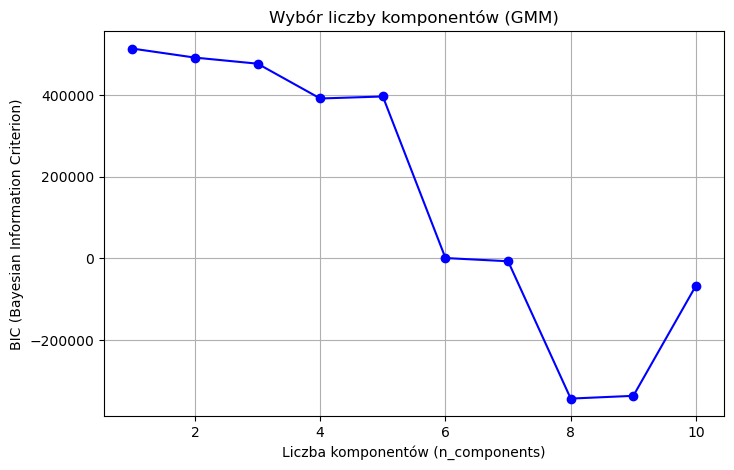

In [14]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# Przygotowanie danych
X_prepared = prepare_X(X_pca[0])

# Zakres liczby komponentów do przetestowania
component_range = range(1, 11)
bic_values = []

for k in component_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X_prepared)
    bic_values.append(gmm.bic(X_prepared))  # Im mniejsze BIC, tym lepiej

# Rysowanie wykresu
plt.figure(figsize=(8, 5))
plt.plot(component_range, bic_values, 'bo-')
plt.xlabel('Liczba komponentów (n_components)')
plt.ylabel('BIC (Bayesian Information Criterion)')
plt.title('Wybór liczby komponentów (GMM)')
plt.grid(True)
plt.show()


In [26]:
# Gaussian Mixture
gmm = GaussianMixture(n_components=6, random_state=42)
labels_gmm = fit_predict_all_splits(gmm, X_pca, model_name="GMM")
for split in labels_gmm:
    labels_dict[split].update(labels_gmm[split])

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but GaussianMixture was fitted without feature names

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but GaussianMixture was fitted without feature names



C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 4 is empty! self.labels_[self.medoid_indices_[4]] may not be labeled with its corresponding cluster (4).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 5 is empty! self.labels_[self.medoid_indices_[

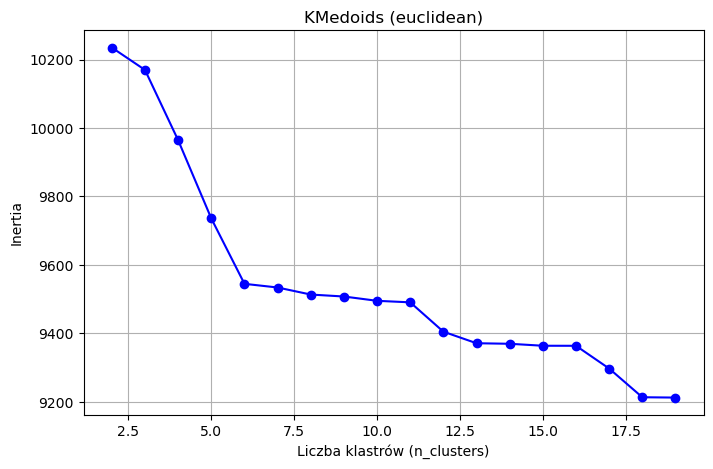

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 14 is empty! self.labels_[self.medoid_indices_[14]] may not be labeled with its corresponding cluster (14).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 6 is empty! self.labels_[self.medoid_indices_[6]] may not be labeled with its corresponding cluster (6).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 6 is empty! self.labels_[self.medoid_indices_[6]] may not be labeled with its corresponding cluster (6).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 6 is empty! self.labels_[self.medoid_indices_[6]] may not be labeled with its corresponding cluster (6).

C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 6 is empty! self.labels_[self.medoid_indice

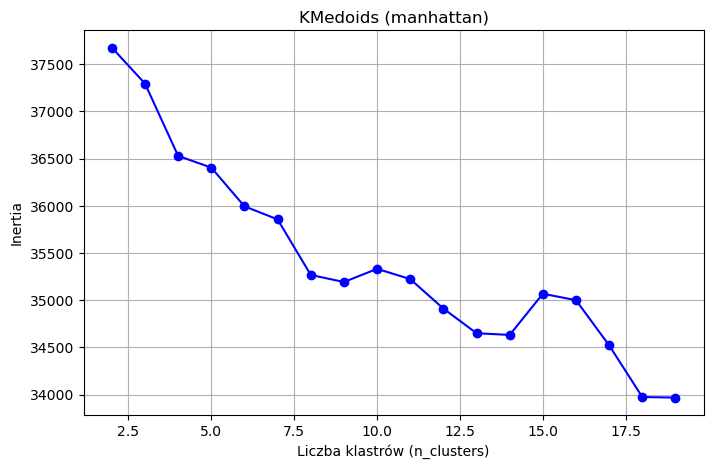

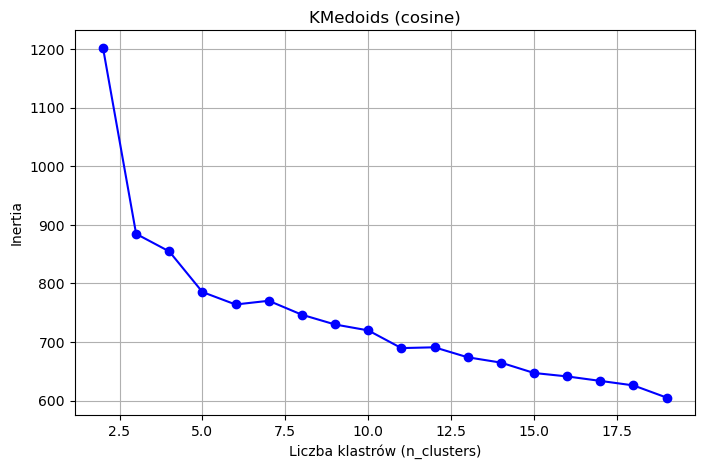

In [27]:
from sklearn_extra.cluster import KMedoids
import matplotlib.pyplot as plt

# Przygotowanie danych
X_prepared = prepare_X(X_pca[0])

# Zakres liczby klastrów
cluster_range = range(2, 20)  # od 2, bo silhouette nie działa dla 1 klastra
medoid_metrics = ['euclidean', 'manhattan', 'cosine']

for metric in medoid_metrics:
    suma_odleglosci = []

    for k in cluster_range:
        kmedoids = KMedoids(n_clusters=k, metric=metric, random_state=21)
        kmedoids.fit(X_prepared)
        # suma odległości punktów do medoidów (inertia-like)
        suma_odleglosci.append(kmedoids.inertia_)

    # Rysowanie wykresu
    plt.figure(figsize=(8, 5))
    plt.plot(cluster_range, suma_odleglosci, 'bo-')
    plt.xlabel('Liczba klastrów (n_clusters)')
    plt.ylabel('Inertia')
    plt.title(f'KMedoids ({metric})')
    plt.grid(True)
    plt.show()


In [28]:
# KMedoids z kilkoma metrykami
medoid_metrics = ['euclidean', 'manhattan', 'cosine']

for metric in medoid_metrics:
    kmedoids = KMedoids(n_clusters=6, metric=metric, random_state=42) #6 wydaje się być optymalne dla wszystkich metryk
    labels_kmedoids = fit_predict_all_splits(kmedoids, X_pca, model_name=f"KMedoids ({metric})")
    
    # Scal do globalnego słownika
    for split in labels_kmedoids:
        labels_dict[split].update(labels_kmedoids[split])


C:\ProgramData\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning:

Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).



In [ ]:
results = []

for split in ['train', 'val']:
    X_split = prepare_X(X_pca[['train', 'val'].index(split)]).to_numpy()
    for method_name, labels in labels_dict[split].items():
        unique_labels = set(labels)
        if len(unique_labels) < 2:
            print(f"Pomijam {method_name} na zbiorze {split} bo jest tylko {len(unique_labels)} klaster(-y)")
            continue
        res = evaluate_clustering(X_split, labels, f"{method_name} ({split})")
        results.append(res)

import pandas as pd
df_results = pd.DataFrame(results)


# Zwiększ maksymalną szerokość kolumn i całkowitą szerokość
pd.set_option("display.max_columns", None)      # Pokaż wszystkie kolumny
pd.set_option("display.width", 200)             # Zwiększ szerokość terminala
pd.set_option("display.max_colwidth", None)     # Pokaż pełną zawartość kolumn (np. stringi)

print(df_results)


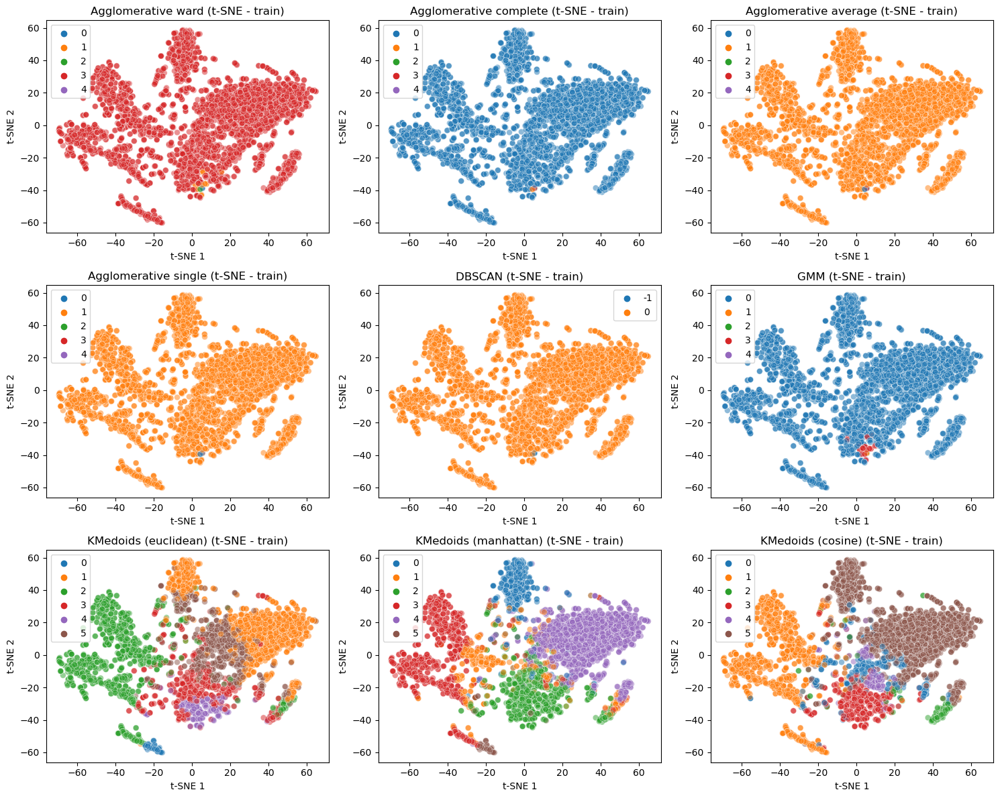

In [23]:
# Funkcja do wizualizacji klastrów 2D
def plot_embedding_split(X_embedded, method_name, labels_for_split, split_name):
    import math
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    n = len(labels_for_split)
    cols = 3
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    axes = axes.flatten()

    for i, (method, labels) in enumerate(labels_for_split.items()):
        ax = axes[i]
        sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=labels, palette='tab10', ax=ax,
                        s=40, alpha=0.5, legend='full')
        ax.set_title(f"{method} ({method_name} - {split_name})")
        ax.set_xlabel(f"{method_name} 1")
        ax.set_ylabel(f"{method_name} 2")
        ax.legend(loc='best')
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    plt.show()

# Wizualizacja
X_train_embedded = TSNE(n_components=2, perplexity=40, random_state=42).fit_transform(prepare_X(X_pca[0]))
plot_embedding_split(X_train_embedded, "t-SNE", labels_dict["train"], "train")

# Analogicznie dla val/test
#X_val_embedded = TSNE(n_components=2, perplexity=10, random_state=42).fit_transform(prepare_X(X_pca[1]))
#plot_embedding_split(X_val_embedded, "t-SNE", labels_dict["val"], "val")

#X_test_embedded = TSNE(n_components=2, perplexity=10, random_state=42).fit_transform(prepare_X(X_pca[2]))
#plot_embedding_split(X_test_embedded, "t-SNE", labels_dict["test"], "test")

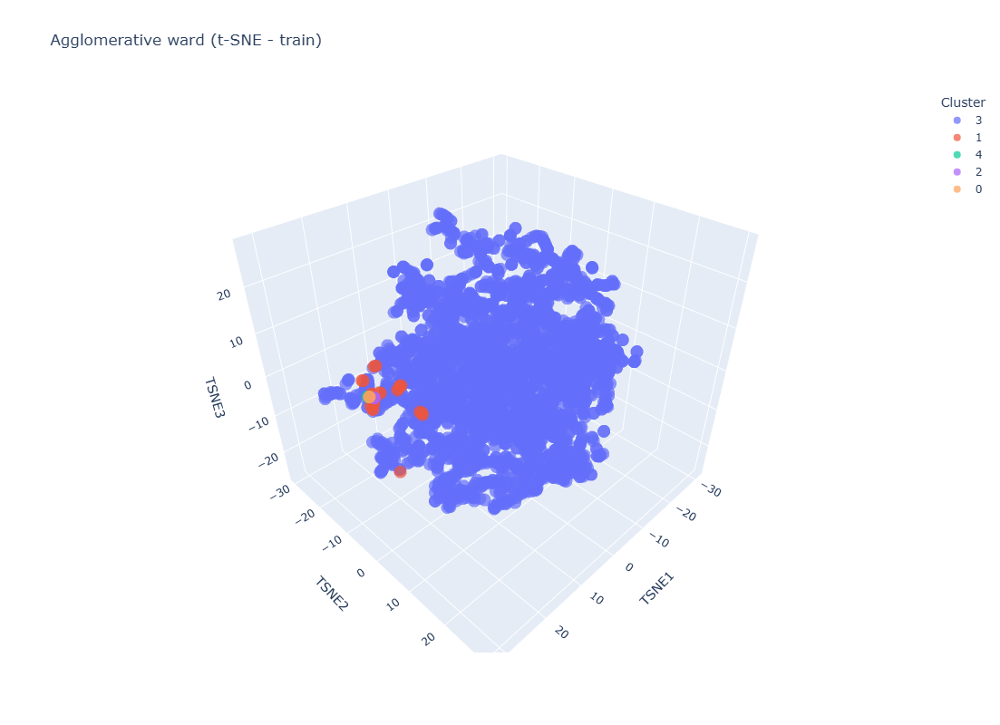

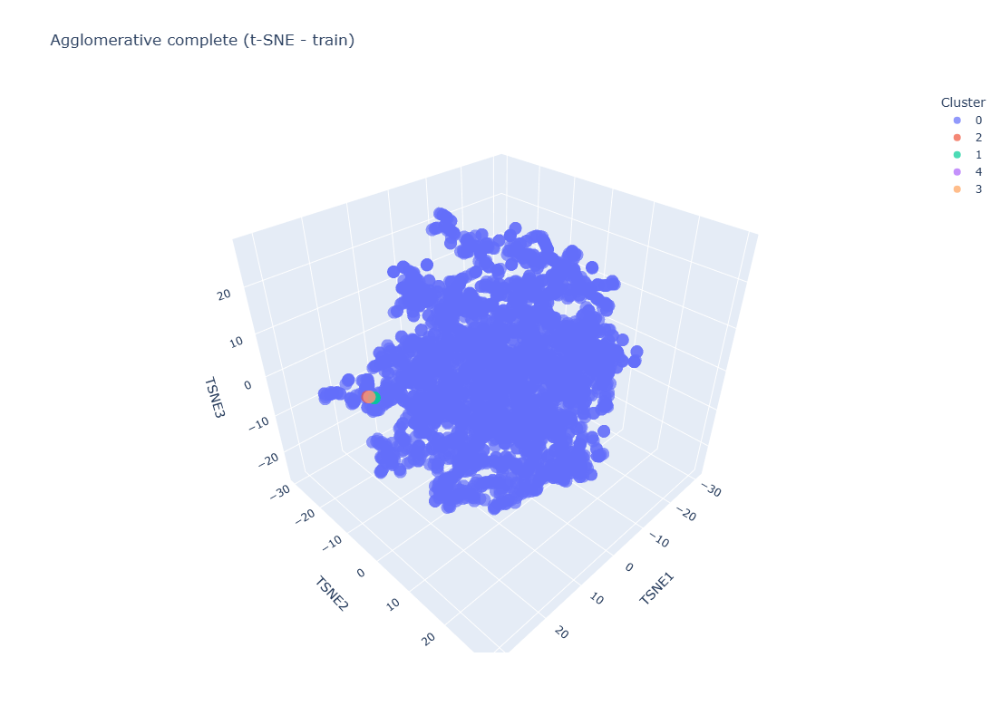

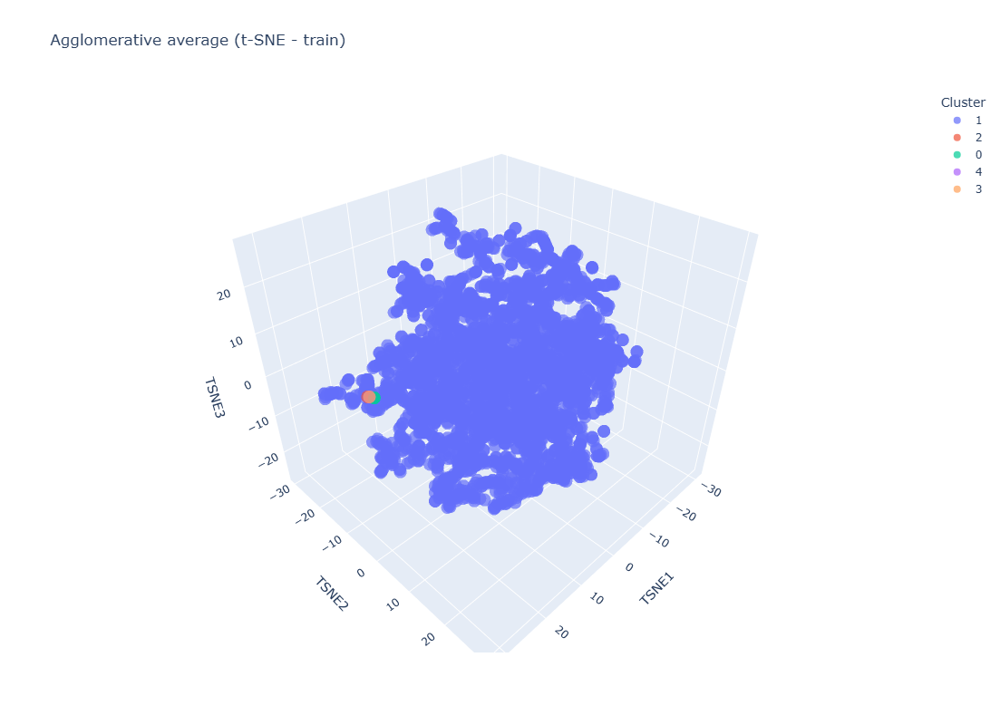

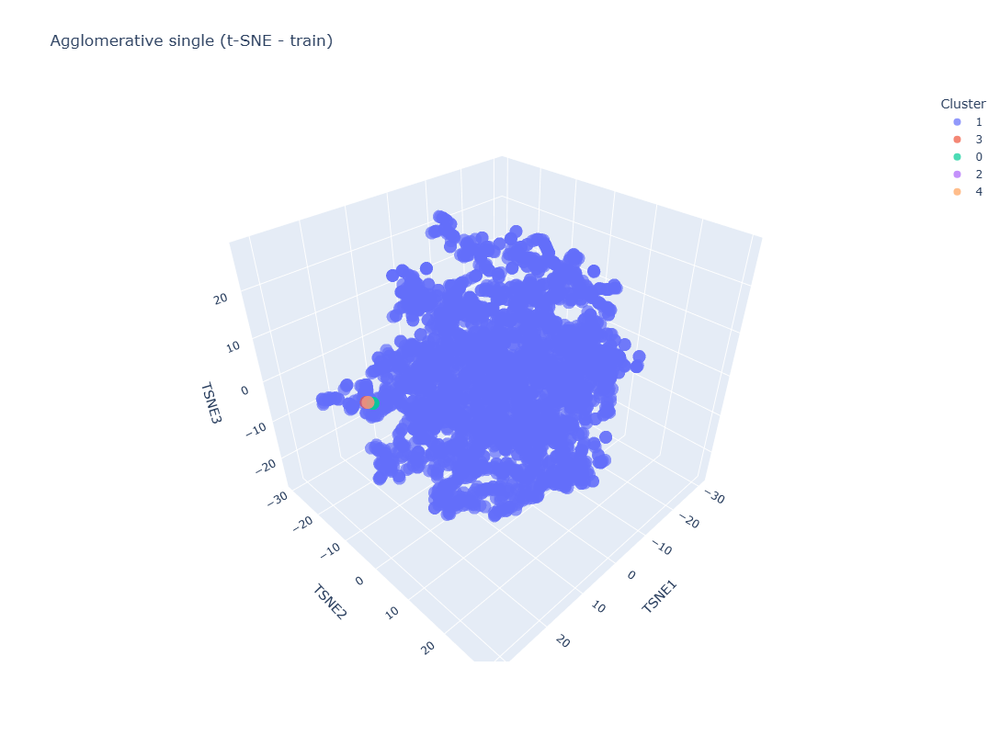

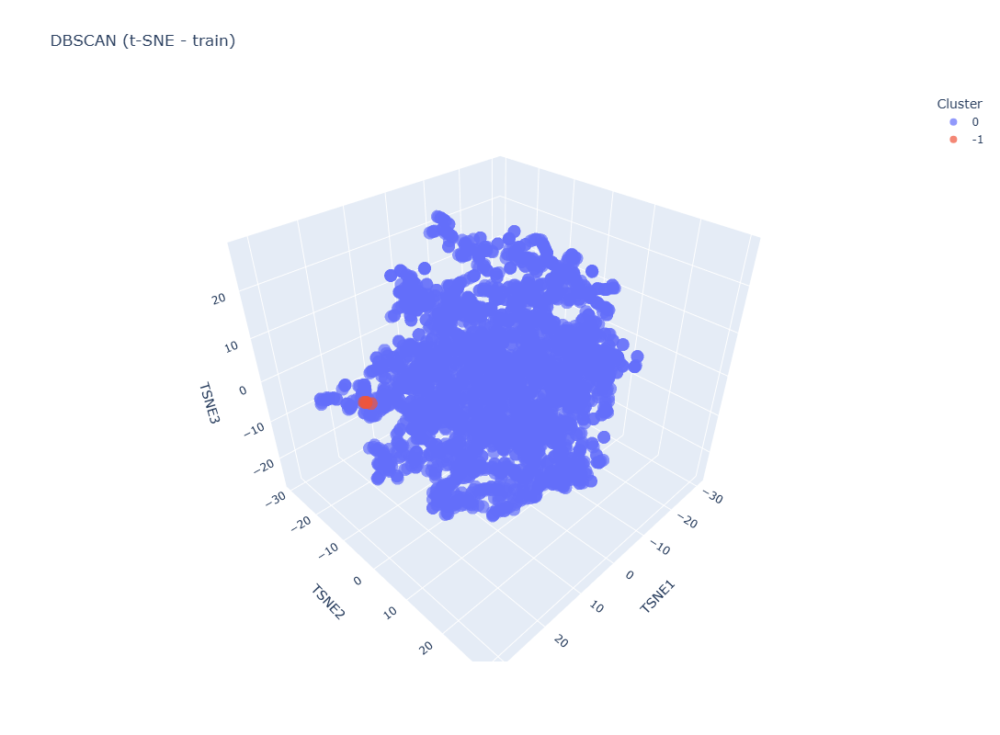

In [24]:
# Funkcja do wizualizacji klastrów 3D

def plot_embedding_split_3d(X_embedded, method_name, labels_for_split, split_name):
    """
    X_embedded: numpy array shape (n_samples, 3)
    labels_for_split: dict {method_name: labels}
    """
    for method, labels in labels_for_split.items():
        df = pd.DataFrame({
            'TSNE1': X_embedded[:, 0],
            'TSNE2': X_embedded[:, 1],
            'TSNE3': X_embedded[:, 2],
            'Cluster': labels.astype(str)
        })
        fig = px.scatter_3d(df, x='TSNE1', y='TSNE2', z='TSNE3',
                            color='Cluster',
                            title=f"{method} ({method_name} - {split_name})",
                            labels={'color': 'Cluster'},
                            opacity=0.7)
        fig.update_layout(width=1000, height=800)  
        fig.show()

#wywołanie 
X_train_embedded_3d = TSNE(n_components=3, perplexity=10, random_state=42).fit_transform(prepare_X(X_pca[0]))
plot_embedding_split_3d(X_train_embedded_3d, "t-SNE", labels_dict["train"], "train")
#X_val_embedded_3d = TSNE(n_components=3, perplexity=10, random_state=42).fit_transform(prepare_X(X_pca[1]))
#plot_embedding_split_3d(X_val_embedded_3d, "t-SNE", labels_dict["val"], "val")

#X_test_embedded_3d = TSNE(n_components=3, perplexity=10, random_state=42).fit_transform(prepare_X(X_pca[2]))
#plot_embedding_split_3d(X_test_embedded_3d, "t-SNE", labels_dict["test"], "test")
